In [15]:
print ('Kernel readay')
path_to_root = '../../..'

Kernel readay


In [16]:
# import required modules
import os
import pandas as pd
import numpy as np
import random

from sklearn import metrics
import logging

In [17]:
#general variables

cols = ['img_id','gt_bbox','gt_format','pred_bbox','pred_format','confidence','gt_size','iou']


# Get results table
* Inputs: 
    * txt files from inference.py
* Outputs:
    * results\_{set}\_\{model}.csv with for one row per image, and cols: img_id, gt_bbox	gt_format, pred_bbox,	pred_format,	confidence,	gt_size,	iou

## Write results table to csv

In [4]:
from Write_results_csv_utils import *

In [6]:
## Writing results table for results_validation_fasterRCNN-08-26.csv

GT_bbox_Dir = os.path.join(path_to_root, 'data/inputs_imagery-7-25_cropped_419/validation_set/validation_set/labels/')
imgs_dir = os.path.join(path_to_root, 'data/inputs_imagery-7-25_cropped_419/validation_set/validation_set/images/')
gt_format = 'xywh_pix'
pred_format = 'y1x1y2x2_pix'

Pred_bbox_Dir = os.path.join(path_to_root, 'results/results_validation_fasterRCNN-08-26')
outputFile = os.path.join(path_to_root, 'results/results_validation_fasterRCNN-08-26.csv')


detect_df = make_results_table(imgs_dir, GT_bbox_Dir, Pred_bbox_Dir, outputFile, gt_format, pred_format)


##Check that all images in the set have a row in the results_df
imgs_fn = [fn for fn in os.listdir(imgs_dir)]
num_images = len(imgs_fn)
print('\n\n'+str(num_images)+' images in directory')
print('results has '+str(len(detect_df))+' rows')



Loading GT & predicted bboxes...
Finished loaded 6565 GT bboxes and 6562 predicted bboxes in 0.02 seconds
Creating results table with ...
... GT bboxes
... predicted bboxes
... confidence
... Bbox size
... IoU
... Done 

Writing CSV ...
... Done


6565 images in directory
results has 6565 rows


In [8]:
## Writing results table for results_validation_fasterRCNN-07-27.csv

GT_bbox_Dir = os.path.join(path_to_root, 'data/inputs_imagery-7-25_cropped_419/validation_set/validation_set/labels/')
imgs_dir = os.path.join(path_to_root, 'data/inputs_imagery-7-25_cropped_419/validation_set/validation_set/images/')
gt_format = 'xywh_pix'
pred_format = 'y1x1y2x2_pix'

Pred_bbox_Dir = os.path.join(path_to_root, 'results/results_validation_fasterRCNN_07-27')
outputFile = os.path.join(path_to_root, 'results/results_validation_fasterRCNN-07-27.csv')


detect_df = make_results_table(imgs_dir, GT_bbox_Dir, Pred_bbox_Dir, outputFile, gt_format, pred_format)


##Check that all images in the set have a row in the results_df
imgs_fn = [fn for fn in os.listdir(imgs_dir)]
num_images = len(imgs_fn)
print('\n\n'+str(num_images)+' images in directory')
print('results has '+str(len(detect_df))+' rows')



Loading GT & predicted bboxes...
Finished loaded 6565 GT bboxes and 6394 predicted bboxes in 0.02 seconds
Creating results table with ...
... GT bboxes
... predicted bboxes
... confidence
... Bbox size
... IoU
... Done 

Writing CSV ...
... Done


6565 images in directory
results has 6565 rows


In [9]:
## Writing results table for results_validationhalfhalf_fasterRCNN-07-27.csv

GT_bbox_Dir = os.path.join(path_to_root, 'data/inputs_imagery-7-25_cropped_419/validation_set/validation_set/labels/')
imgs_dir = os.path.join(path_to_root, 'data/validation_halfhalf/images')
gt_format = 'xywh_pix'
pred_format = 'y1x1y2x2_pix'

Pred_bbox_Dir = os.path.join(path_to_root, 'results/results_validationhalfhalf_fasterRCNN_07-27')
outputFile = os.path.join(path_to_root, 'results/results_validationhalfhalf_fasterRCNN-07-27.csv')


detect_df = make_results_table(imgs_dir, GT_bbox_Dir, Pred_bbox_Dir, outputFile, gt_format, pred_format)


##Check that all images in the set have a row in the results_df
imgs_fn = [fn for fn in os.listdir(imgs_dir)]
num_images = len(imgs_fn)
print('\n\n'+str(num_images)+' images in directory')
print('results has '+str(len(detect_df))+' rows')



Loading GT & predicted bboxes...
Finished loaded 6565 GT bboxes and 10894 predicted bboxes in 0.03 seconds
Creating results table with ...
... GT bboxes
... predicted bboxes
... confidence
... Bbox size
... IoU
... Done 

Writing CSV ...
... Done


12237 images in directory
results has 12237 rows


In [11]:
## Writing results table for results_validationhalfhalf_fasterRCNN-08-26.csv

GT_bbox_Dir = os.path.join(path_to_root, 'data/inputs_imagery-7-25_cropped_419/validation_set/validation_set/labels/')
imgs_dir = os.path.join(path_to_root, 'data/validation_halfhalf/images')
gt_format = 'xywh_pix'
pred_format = 'y1x1y2x2_pix'

Pred_bbox_Dir = os.path.join(path_to_root, 'results/results_validationhalfhalf_fasterRCNN-08-26')
outputFile = os.path.join(path_to_root, 'results/results_validationhalfhalf_fasterRCNN-08-26.csv')


detect_df = make_results_table(imgs_dir, GT_bbox_Dir, Pred_bbox_Dir, outputFile, gt_format, pred_format)


##Check that all images in the set have a row in the results_df
imgs_fn = [fn for fn in os.listdir(imgs_dir)]
num_images = len(imgs_fn)
print('\n\n'+str(num_images)+' images in directory')
print('results has '+str(len(detect_df))+' rows')



Loading GT & predicted bboxes...
Finished loaded 6565 GT bboxes and 12228 predicted bboxes in 0.03 seconds
Creating results table with ...
... GT bboxes
... predicted bboxes
... confidence
... Bbox size
... IoU
... Done 

Writing CSV ...
... Done


12237 images in directory
results has 12237 rows


## Add predicted_size column + fix bboxes formats

In [183]:
def fix_the_results_table(path_to_rez_table):
    # Read current resutls table
    results_df = pd.read_csv(path_to_rez_table)

    # Fix bboxes formats
    #old gt_format = 'xywh_pix'
    #old pred_format = 'y1x1y2x2_pix'
    gt_format = 'x1y1x1y2_pix'
    pred_format = 'y2x1y1x1_pix'

    results_df['pred_format'] = pred_format
    results_df['gt_format'] = gt_format

    # Add pred_size column
    results_df['pred_bbox_f'] = results_df['pred_bbox'].apply(lambda x: 
                                                        None if (x is np.nan or x is None)
                                                        else x.replace('[','').replace(']','').replace('  ',' ').replace('  ',' ').split(' '))
    results_df['pred_size'] = results_df['pred_bbox_f'].apply(lambda x: 
                                                      None if (x is np.nan or x is None)
                                                      else int((int(x[-1]) - int(x[-3])) * (int(x[-4]) - int(x[-2]))))
    results_df = results_df.drop('pred_bbox_f',axis=1)
    
    # Write the fixed csv
    results_df.set_index('img_id')
    results_df.to_csv(path_to_rez_table)

In [184]:
path_to_root = '../../..'

path_to_rez_table = os.path.join(path_to_root,'results','results_validationhalfhalf_fasterRCNN-07-27.csv')
fix_the_results_table(path_to_rez_table)

In [185]:
results_df = pd.read_csv(path_to_rez_table)
results_df.head()

,Unnamed: 0,Unnamed: 0.1,img_id,gt_bbox,gt_format,pred_bbox,pred_format,confidence,gt_size,iou,pred_size
0,0,0,66.469_70.741_66.487_70.759,NaN,x1y1x1y2_pix,[417 62 50 381],y2x1y1x1_pix,0.2193,NaN,NaN,117073.0
1,1,1,107712,[315 311 333 337],x1y1x1y2_pix,[328 311 308 338],y2x1y1x1_pix,0.2847,468.0,0.435897,540.0
2,2,2,54.53675_24.613500000000002_54.55475_24.6315,NaN,x1y1x1y2_pix,[118 330 49 371],y2x1y1x1_pix,0.1957,NaN,NaN,2829.0
3,3,3,34.897_-17.19925_34.915_-17.18125,NaN,x1y1x1y2_pix,[120 200 110 213],y2x1y1x1_pix,0.0913,NaN,NaN,130.0
4,4,4,112998,[132 116 201 216],x1y1x1y2_pix,[219 130 117 209],y2x1y1x1_pix,0.9600,6900.0,0.840532,8058.0


## Load an existing results table

In [195]:
# Load csv
path_to_root = '../../..'
path_to_rez_table = os.path.join(path_to_root,'results','results_validation_fasterRCNN-07-27.csv')
results_df = pd.read_csv(path_to_rez_table)

results_df_vsmall = results_df[results_df['gt_size']<500]
results_df_smalldams = results_df[(results_df['gt_size']>=500) & (results_df['gt_size']<=1800)]
results_df_vbig = results_df[results_df['gt_size']>1800]

results_df_smallpreds = results_df[(results_df['pred_size']>=500) & (results_df['pred_size']<=1800)]


results_table_name = 'results_validation_fasterRCNN-07-27.csv'

In [197]:
# Load csv
path_to_root = '../../..'
path_to_rez_table = os.path.join(path_to_root,'results','results_validationhalfhalf_fasterRCNN-07-27.csv')
results_df = pd.read_csv(path_to_rez_table)

results_df_vsmall = results_df[results_df['gt_size']<500]
results_df_smalldams = results_df[(results_df['gt_size']>=500) & (results_df['gt_size']<=1800)]
results_df_vbig = results_df[results_df['gt_size']>1800]

results_df_smallpreds = results_df[(results_df['pred_size']>=500) & (results_df['pred_size']<=1800)]


results_table_name = 'results_validationhalfhalf_fasterRCNN-07-27.csv'

In [199]:
# Load csv
path_to_root = '../../..'
path_to_rez_table = os.path.join(path_to_root, 'results/results_validation_fasterRCNN-08-26.csv')
results_df = pd.read_csv(path_to_rez_table)

results_df_vsmall = results_df[results_df['gt_size']<500]
results_df_smalldams = results_df[(results_df['gt_size']>=500) & (results_df['gt_size']<=1800)]
results_df_vbig = results_df[results_df['gt_size']>1800]

results_df_smallpreds = results_df[(results_df['pred_size']>=500) & (results_df['pred_size']<=1800)]


results_table_name = 'results_validation_fasterRCNN-08-26.csv'

In [201]:
# Load csv
path_to_root = '../../..'
path_to_rez_table = os.path.join(path_to_root, 'results/results_validationhalfhalf_fasterRCNN-08-26.csv')
results_df = pd.read_csv(path_to_rez_table)

results_df_vsmall = results_df[results_df['gt_size']<500]
results_df_smalldams = results_df[(results_df['gt_size']>=500) & (results_df['gt_size']<=1800)]
results_df_vbig = results_df[results_df['gt_size']>1800]

results_df_smallpreds = results_df[(results_df['pred_size']>=500) & (results_df['pred_size']<=1800)]


results_table_name = 'results_validationhalfhalf_fasterRCNN-08-26.csv'

In [8]:
results_df.head(100)

,img_id,gt_bbox,gt_format,pred_bbox,pred_format,confidence,gt_size,iou
0,2672,[305 300 377 382],xywh_pix,[347 305 314 383],y1x1y2x2_pix,0.9207,5904.0,0.389381
1,125569,[185 198 356 343],xywh_pix,[312 181 205 351],y1x1y2x2_pix,0.7666,24795.0,0.704199
2,125730,[106 94 246 258],xywh_pix,[258 141 111 198],y1x1y2x2_pix,0.9229,22960.0,0.364939
3,105933,[314 321 357 350],xywh_pix,[350 320 326 353],y1x1y2x2_pix,0.6868,1247.0,0.635124
4,8124,[176 192 220 204],xywh_pix,[238 102 229 119],y1x1y2x2_pix,0.0849,528.0,0.000000
5,8382,[105 127 187 165],xywh_pix,[164 104 117 182],y1x1y2x2_pix,0.7558,3116.0,0.724383
6,124613,[241 231 274 283],xywh_pix,[286 240 230 275],y1x1y2x2_pix,0.6397,1716.0,0.875510
7,6270,[154 169 216 200],xywh_pix,[202 157 171 212],y1x1y2x2_pix,0.8962,1922.0,0.784941
8,113486,[246 250 262 257],xywh_pix,[195 131 178 143],y1x1y2x2_pix,0.1111,112.0,0.000000
9,99656,[106 130 198 174],xywh_pix,[170 108 131 187],y1x1y2x2_pix,0.2583,4048.0,0.761117


## Filter by size
Size is based on ground truth bounding box size, in pixel. "Small dams" at size of interest are between 500 to 1800 pixels.

In [23]:
results_df_vsmall = results_df[results_df['gt_size']<500]
results_df_smalldams = results_df[(results_df['gt_size']>=500) & (results_df['gt_size']<=1800)]
results_df_vbig = results_df[results_df['gt_size']>1800]

##Print dataset stats

num_imgs = len(results_df)
num_dams = np.where(results_df.gt_bbox.notnull(), 1, 0).sum()

print('For this set from ',results_table_name,':')
print(' ')
print('-- ',len(results_df),' images total')
print('--  {} ({:.0f}%) are dams'.format(num_dams,num_dams/num_imgs*100))

print('    of which --  {:.1f}% are "Small dams" (size of interest 500-1800)'.format(len(results_df_smalldams)/num_dams*100))
print('             --  {:.1f}% are smaller'.format(len(results_df_vsmall)/num_dams*100))
print('             --  {:.1f}% are bigger'.format(len(results_df_vbig)/num_dams*100))

For this set from  results_validationhalfhalf_fasterRCNN-08-26.csv :
 
--  12237  images total
--  5672 (46%) are dams
    of which --  26.1% are "Small dams" (size of interest 500-1800)
             --  27.9% are smaller
             --  46.0% are bigger


# Custom evaluation
* Inputs
    * results\_{set}\_{model}.csv
* Outputs
     * Evaluation metrics:
      - For Dams sizes = _Small dams_
      - Recall @ 5% IoU and ≠ min confidence thresholds.

In [24]:
# Evaluation utils
from evaluation_utils import *

In [12]:
print('For all dams sizes: \n')
iou_thres = 0.05
for conf_thres in [0.1,0.2,0.3,0.4,0.5,0.7]:
    print('with min. Confidence = '+str(conf_thres))
    results_df = add_result_col (results_df, iou_thres, conf_thres)
    Category = 'Cat@IoU'+str(iou_thres)+'@conf'+str(conf_thres)


    # % of images per category
    count_categories = results_df[cols+[Category]].groupby(Category).count()['img_id']
    num_TP = count_categories['TP']/len(results_df)*100
    num_FP = count_categories['FP']/len(results_df)*100
    num_FPFN = count_categories['FP+FN']/len(results_df)*100

    print('TP: {:.1f}%,  FP: {:.1f}%, FP+FN: {:.1f}%\n'.format(num_TP, num_FP, num_FPFN))

For all dams sizes: 

with min. Confidence = 0.1
TP: 61.4%,  FP: 5.4%, FP+FN: 30.6%

with min. Confidence = 0.2
TP: 57.9%,  FP: 2.6%, FP+FN: 36.8%

with min. Confidence = 0.3
TP: 54.3%,  FP: 1.7%, FP+FN: 41.4%

with min. Confidence = 0.4
TP: 50.5%,  FP: 1.2%, FP+FN: 45.7%

with min. Confidence = 0.5
TP: 45.5%,  FP: 0.9%, FP+FN: 51.0%

with min. Confidence = 0.7
TP: 32.5%,  FP: 0.4%, FP+FN: 64.5%



In [202]:
print(results_table_name.upper())
print("--------------------------------- \n")

print('For all dams sizes: \n')
iou_thres = 0.05
for conf_thres in [0.1,0.2,0.3,0.4,0.5,0.7]:
    print('with min. Confidence = '+str(conf_thres))
    results_df = add_result_col (results_df, iou_thres, conf_thres)
    Category = 'Cat@IoU'+str(iou_thres)+'@conf'+str(conf_thres)


    # % of images per category
    count_categories = results_df[cols+[Category]].groupby(Category).count()['img_id']
    num_TP = count_categories['TP']/len(results_df)*100
    num_FP = count_categories['FP']/len(results_df)*100
    num_FPFN = count_categories['FP+FN']/len(results_df)*100
    num_TN = count_categories['TN']/len(results_df)*100
    num_FN = 100 - (num_TP+num_FP+num_FPFN+num_TN)
    
    print('TP: {:.1f}%,  FP: {:.1f}%, FP+FN: {:.1f}%, FN: {:.3f}%, TN: {:.3f}%\n'.format(num_TP, num_FP, num_FPFN, num_FN, num_TN))
    

iou = 0.05
conf = 0.1

print('\nFor Small dams in this set (defined by GT size):')
r = get_recall_score(results_df_smalldams, iou, conf)
p = get_precision_score(results_df_smalldams, iou, conf)
print('IoU {}, Confidence {} --> Recall: {:.2f}, Precision: {:.2f} '.format(iou, conf, r,p),'\n')

print('\nFor Small dams in this set (defined by predicted size):')
r = get_recall_score(results_df_smallpreds, iou, conf)
p = get_precision_score(results_df_smallpreds, iou, conf)
print('IoU {}, Confidence {} --> Recall: {:.3f}, Precision: {:.3f} '.format(iou, conf, r,p),'\n')

print('For all dams in this set:')
r = get_recall_score(results_df, iou, conf)
p = get_precision_score(results_df, iou, conf)
print('IoU {}, Confidence {} --> Recall: {:.2f}, Precision: {:.2f} '.format(iou, conf, r,p),'\n')

print('For too small dams in this set:')
r = get_recall_score(results_df_vsmall, iou, conf)
print('IoU {}, Confidence {} --> Recall: {:.2f}'.format(iou, conf, r))

print('For too big in this set:')
r = get_recall_score(results_df_vbig, iou, conf)
print('IoU {}, Confidence {} --> Recall: {:.2f}'.format(iou, conf, r))

RESULTS_VALIDATIONHALFHALF_FASTERRCNN-08-26.CSV
--------------------------------- 

For all dams sizes: 

with min. Confidence = 0.1
TP: 32.7%,  FP: 17.6%, FP+FN: 49.6%, FN: 0.000%, TN: 0.074%

with min. Confidence = 0.2
TP: 30.5%,  FP: 4.1%, FP+FN: 65.3%, FN: -0.000%, TN: 0.074%

with min. Confidence = 0.3
TP: 28.7%,  FP: 2.6%, FP+FN: 68.7%, FN: -0.000%, TN: 0.074%

with min. Confidence = 0.4
TP: 26.4%,  FP: 1.7%, FP+FN: 71.8%, FN: -0.000%, TN: 0.074%

with min. Confidence = 0.5
TP: 24.0%,  FP: 1.2%, FP+FN: 74.7%, FN: -0.000%, TN: 0.074%

with min. Confidence = 0.7
TP: 17.4%,  FP: 0.4%, FP+FN: 82.1%, FN: -0.000%, TN: 0.074%


For Small dams in this set (defined by GT size):
df column Cat@IoU0.05@conf0.1 do not exist. Making it...
IoU 0.05, Confidence 0.1 --> Recall: 0.72, Precision: 0.86  


For Small dams in this set (defined by predicted size):
df column Cat@IoU0.05@conf0.1 do not exist. Making it...
IoU 0.05, Confidence 0.1 --> Recall: 0.720, Precision: 0.841  

For all dams in thi

In [104]:
for iou in [0, 0.05, 0.2]:
    for conf in [0.3,0.5,0.7,0.9]:
        r = get_recall_score(results_df, iou, conf)
        print('IoU {}, Confidence {} --> Recall: {:.2f}'.format(iou, conf, r))

IoU 0, Confidence 0.3 --> Recall: 0.64
IoU 0, Confidence 0.5 --> Recall: 0.53
IoU 0, Confidence 0.7 --> Recall: 0.38
IoU 0, Confidence 0.9 --> Recall: 0.13
IoU 0.05, Confidence 0.3 --> Recall: 0.63
IoU 0.05, Confidence 0.5 --> Recall: 0.53
IoU 0.05, Confidence 0.7 --> Recall: 0.38
IoU 0.05, Confidence 0.9 --> Recall: 0.13
IoU 0.2, Confidence 0.3 --> Recall: 0.59
IoU 0.2, Confidence 0.5 --> Recall: 0.50
IoU 0.2, Confidence 0.7 --> Recall: 0.36
IoU 0.2, Confidence 0.9 --> Recall: 0.12


# Visualize

In [45]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from shapely.geometry import box

from viz_utils import *

In [155]:
df = results_df[results_df['iou']>0.95].copy()

In [156]:
imgDir = os.path.join(path_to_root,'data','inputs_imagery-7-25_cropped_419','validation_set','images')

visualize_bboxes(df, imgDir)

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

<Figure size 864x17280 with 0 Axes>

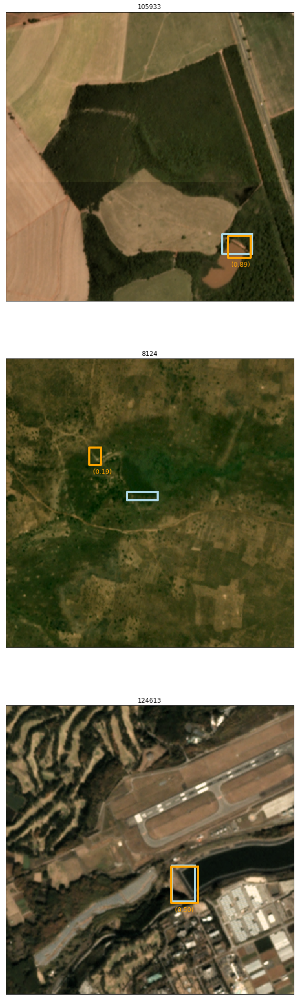

In [43]:
imgDir = os.path.join(path_to_root,'data','inputs_imagery-7-25_cropped_419','validation_set','images')

visualize_bboxes(results_df_smalldams.loc[0:10], imgDir)

ValueError: num must be 1 <= num <= 20, not 21

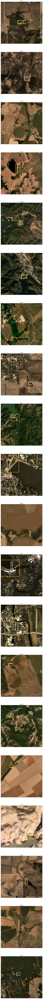

In [46]:
# Saving the images

imgDir = os.path.join(path_to_root,'data','inputs_imagery-7-25_cropped_419','validation_set','images')
saveDir = os.path.join(path_to_root,'results','images_validationsample_fasterRCNN07-27')

visualize_bboxes(results_df_smalldams.loc[300:400], imgDir,
                 save_dir=saveDir)

# Human* baseline performance
\*(Charlie & friends)

### Humans look at:

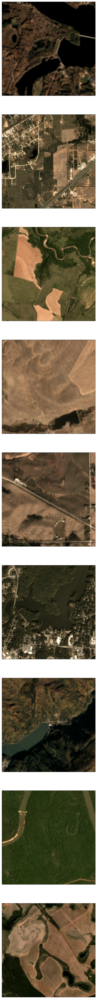

In [231]:
visualize_bboxes(results_df_smalldams.loc[200:250], imgDir,
                 NO_BOXES=True)

### Check against:

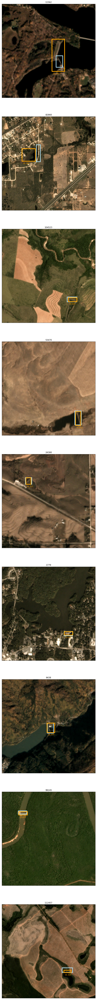

In [230]:
visualize_bboxes(results_df_smalldams.loc[200:250], imgDir)